<a href="https://colab.research.google.com/github/rantrek/Vocal-Folds/blob/main/VocalFolds_Unet_new.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This project uses the **VocalFolds** dataset. It comprises a set of images and segmentation masks.

All images in the dataset are of size 512x512.

For more information about the dataset, visit https://github.com/imesluh/vocalfolds.

Portions of the code are borrowed from this car segmentation example at
https://github.com/qubvel/segmentation_models.pytorch/tree/master/examples and modified.

For more information on the segmentation model used here, visit this
github page at https://github.com/qubvel/segmentation_models.pytorch

## Installing pytorch and data augmentation packages

In [47]:
#!pip install -U segmentation-models-pytorch
#!pip install -U git+https://github.com/albu/albumentations --no-cache-dir

## Loading data

In [2]:
#Import all required libraries

import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

import numpy as np
import cv2
import matplotlib.pyplot as plt
import torch
from torch.utils.data import DataLoader
from torch.utils.data import Dataset as BaseDataset
from torchvision import transforms, utils, datasets, models
import albumentations as albu
import segmentation_models_pytorch as smp
from segmentation_models_pytorch.utils.losses import DiceLoss
from segmentation_models_pytorch.utils.metrics import IoU
from segmentation_models_pytorch.utils.train import TrainEpoch, ValidEpoch

In [3]:
#If using google colab to run this notebook

#Load vocal folds dataset from github
!git clone https://github.com/imesluh/vocalfolds
%cd vocalfolds

Cloning into 'vocalfolds'...
remote: Enumerating objects: 1181, done.
remote: Total 1181 (delta 0), reused 0 (delta 0), pack-reused 1181
Receiving objects: 100% (1181/1181), 204.46 MiB | 17.27 MiB/s, done.
Resolving deltas: 100% (45/45), done.
/content/vocalfolds


In [4]:
def moveData(src,dst):
  """Move images from source folder to destination folder
   The images in the source folder are placed in multiple sub-directories and needs to be moved to a single folder.
  Args:
    src: source folder
    dst: destination folder
  """

  # Create destination folder if it doesn't exist
  if not os.path.exists(dst):
      os.makedirs(dst)

  # Loop through all files and subdirectories in source folder
  for root, dirs, files in os.walk(src):

      # Loop through all files in current directory
      for file in files:

          # Create full path for the file
          file_path = os.path.join(root, file)

          # Copy the file to the destination folder
          os.rename(file_path, os.path.join(dst, file))

      # Loop through all subdirectories in current directory
      for dir in dirs:

          # Create full path for the subdirectory
          dir_path = os.path.join(root, dir)

          # Copy all files and subdirectories in the subdirectory to the destination folder
          for subroot, subdirs, subfiles in os.walk(dir_path):
              for subfile in subfiles:
                  subfile_path = os.path.join(subroot, subfile)
                  os.rename(subfile_path, os.path.join(dst, subfile))




In [ ]:
#Add two new folders to the main directory, images (to store all images) and masks (to store all corresponding masks)

In [5]:
#Move images and associated masks to single folder each

img_dir= './img/'
mask_dir = './annot/'
img ='./images/'
mask= './masks/'

moveData(img_dir,img)
moveData(mask_dir,mask)









In [35]:
# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()

### Dataloader

Helper class for data extraction, transformation and preprocessing  
https://pytorch.org/docs/stable/data

In [7]:
class Dataset(BaseDataset):
    """VocalFolds Dataset. Read images, apply augmentation and preprocessing transformations.

    Args:
        images_dir (str): path to images folder
        masks_dir (str): path to segmentation masks folder
        class_values (list): values of classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transfromation pipeline
            (e.g. flip, scale, etc.)
        preprocessing (albumentations.Compose): data preprocessing
            (e.g. noralization, shape manipulation, etc.)

    """

    CLASSES = ['void', 'vocal folds', 'other tissue', 'glottal space', 'pathology',
               'surgical tool', 'intubation']

    def __init__(
            self,
            images_dir,
            masks_dir,
            classes=None,
            augmentation=None,
            preprocessing=None,
    ):
        self.ids = os.listdir(images_dir)
        self.images_fps = [os.path.join(images_dir, image_id) for image_id in self.ids]
        self.masks_fps = [os.path.join(masks_dir, image_id) for image_id in self.ids]

        # convert str names to class values on masks
        self.class_values = [self.CLASSES.index(cls.lower()) for cls in classes]

        self.augmentation = augmentation
        self.preprocessing = preprocessing

    def __getitem__(self, i):

        # read data
        image = cv2.imread(self.images_fps[i])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(self.masks_fps[i], 0)

        # extract certain classes from mask (e.g. cars)
        masks = [(mask == v) for v in self.class_values]
        mask = np.stack(masks, axis=-1).astype('float')

        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']

        return image, mask

    def __len__(self):
        return len(self.ids)

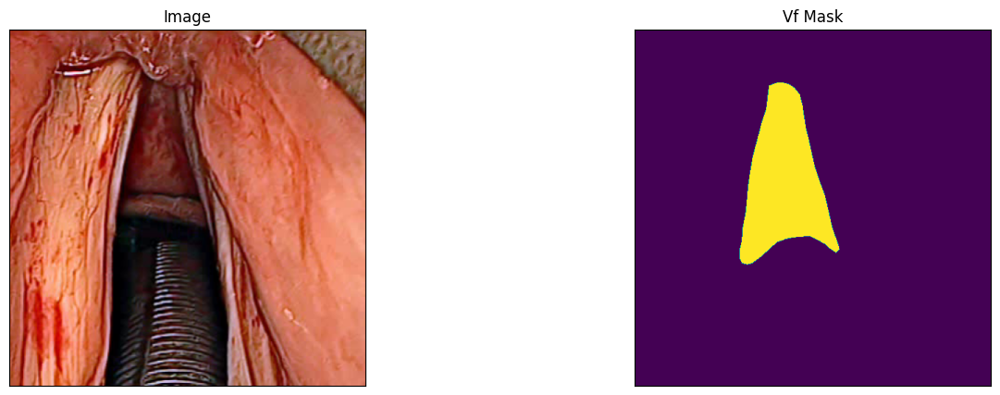

In [ ]:
# Lets look at data we have

original_dataset = Dataset(img, mask, classes=['glottal space'])

image, mask = original_dataset[1] # get some sample
visualize(
    image=image,
    vf_mask=mask.squeeze(),
)

### Augmentations

Data augmentation is a powerful technique to increase the amount of your data and prevent model overfitting.  
If you not familiar with such trick read some of these articles:
 - [The Effectiveness of Data Augmentation in Image Classification using Deep
Learning](http://cs231n.stanford.edu/reports/2017/pdfs/300.pdf)
 - [Data Augmentation | How to use Deep Learning when you have Limited Data](https://medium.com/nanonets/how-to-use-deep-learning-when-you-have-limited-data-part-2-data-augmentation-c26971dc8ced)
 - [Data Augmentation Experimentation](https://towardsdatascience.com/data-augmentation-experimentation-3e274504f04b)

Since our dataset is very small we will apply a large number of different augmentations:
 - horizontal flip
 - affine transforms
 - perspective transforms
 - brightness/contrast/colors manipulations
 - image bluring and sharpening
 - gaussian noise
 - random crops

All this transforms can be easily applied with [**Albumentations**](https://github.com/albu/albumentations/) - fast augmentation library.
For detailed explanation of image transformations you can look at [kaggle salt segmentation exmaple](https://github.com/albu/albumentations/blob/master/notebooks/example_kaggle_salt.ipynb) provided by [**Albumentations**](https://github.com/albu/albumentations/) authors.

In [9]:
def get_augmentation():
    data_transform = [

        albu.HorizontalFlip(p=0.5),

        albu.ShiftScaleRotate(scale_limit=0.5, rotate_limit=0, shift_limit=0.1, p=1),

        albu.PadIfNeeded(min_height=320, min_width=320, always_apply=True),
        albu.RandomCrop(height=320, width=320, always_apply=True),

        #albu.IAAAdditiveGaussianNoise(p=0.2),
        #albu.IAAPerspective(p=0.5),

        albu.OneOf(
            [
                albu.CLAHE(p=1),
                #albu.RandomBrightness(p=1),
                albu.RandomGamma(p=1),
            ],
            p=0.9,
        ),

        albu.OneOf(
            [
                #albu.IAASharpen(p=1),
                albu.Blur(blur_limit=3, p=1),
                albu.MotionBlur(blur_limit=3, p=1),
            ],
            p=0.9,
        ),

        albu.OneOf(
            [
                #albu.RandomContrast(p=1),
                albu.HueSaturationValue(p=1),
            ],
            p=0.9,
        ),
    ]
    return albu.Compose(data_transform)



def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn):
    """Construct preprocessing transform

    Args:
        preprocessing_fn (callbale): data normalization function
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose

    """

    _transform = [
        albu.Lambda(image=preprocessing_fn),
        albu.Lambda(image=to_tensor, mask=to_tensor),
    ]
    return albu.Compose(_transform)

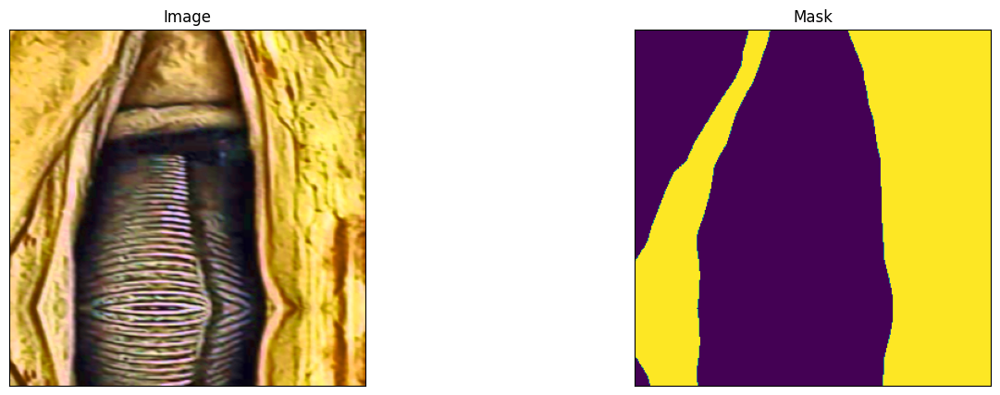

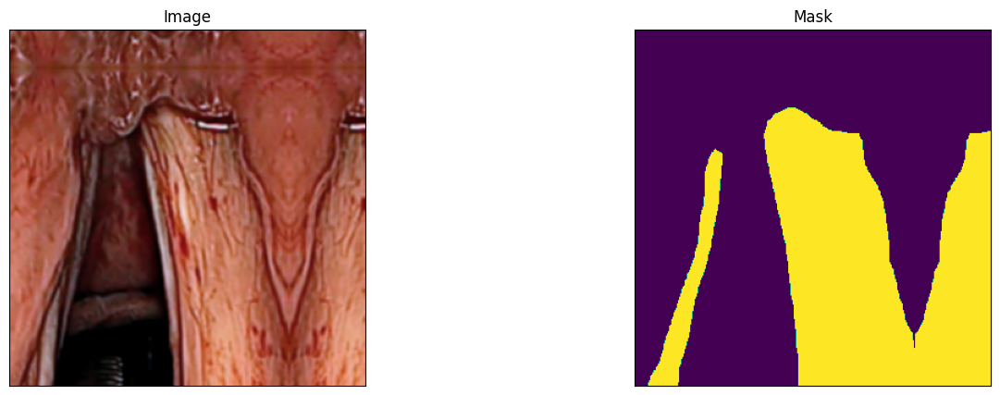

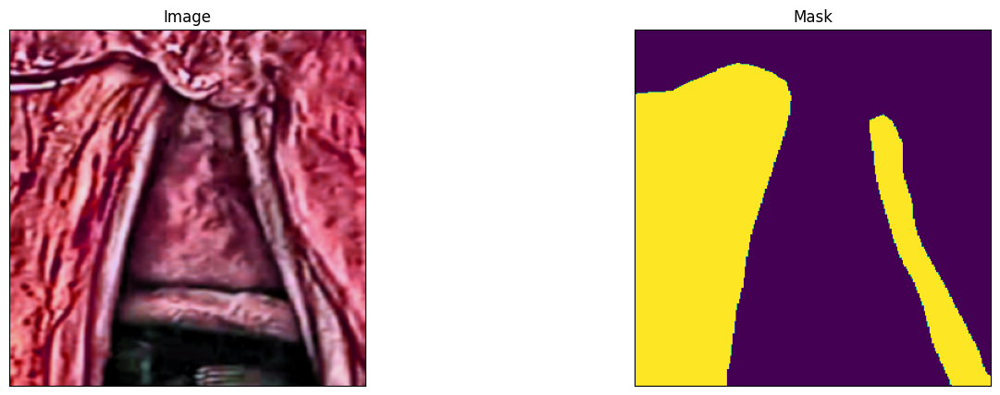

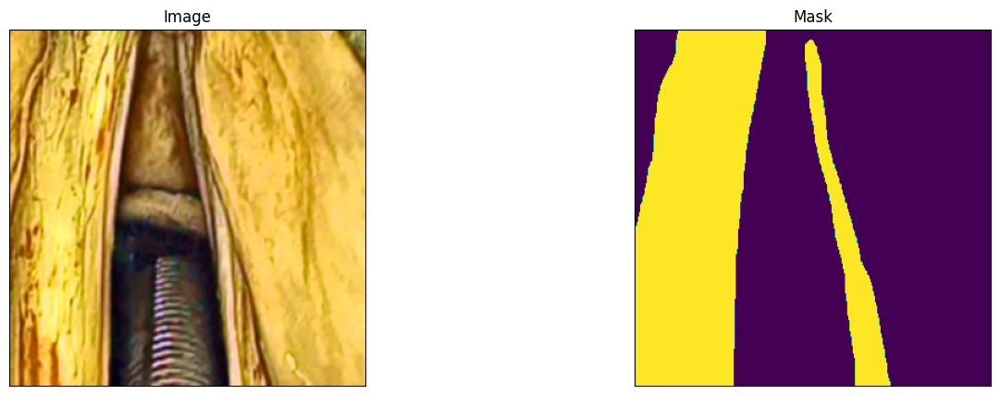

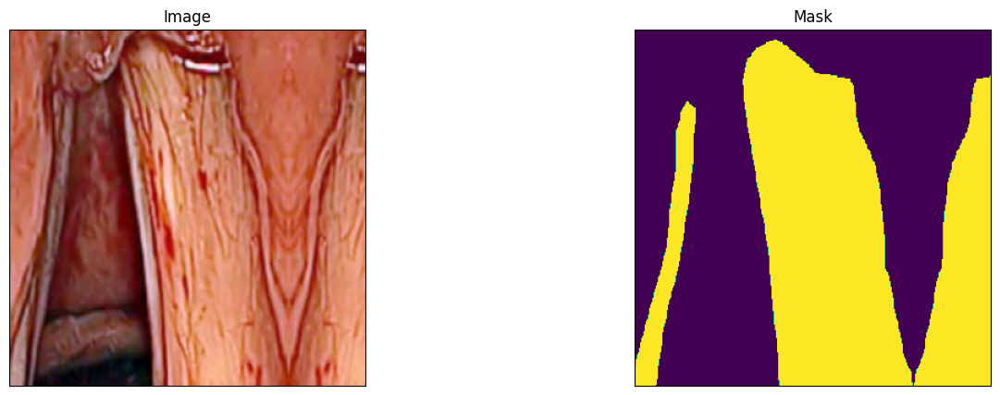

...

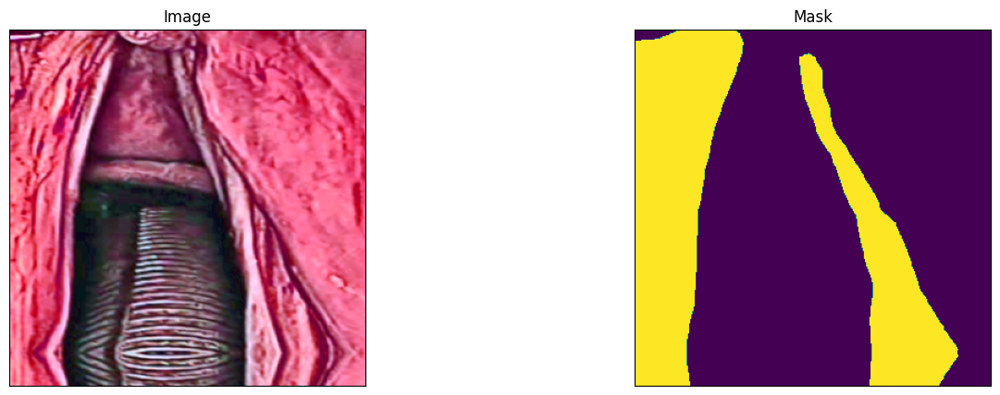

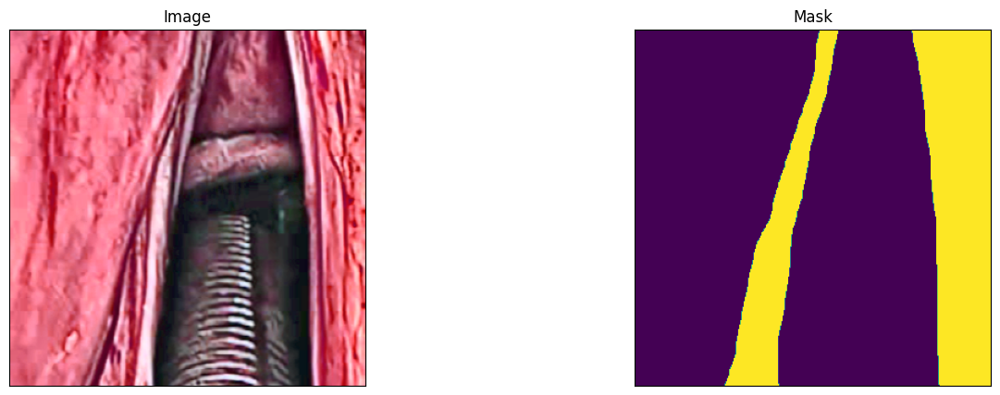

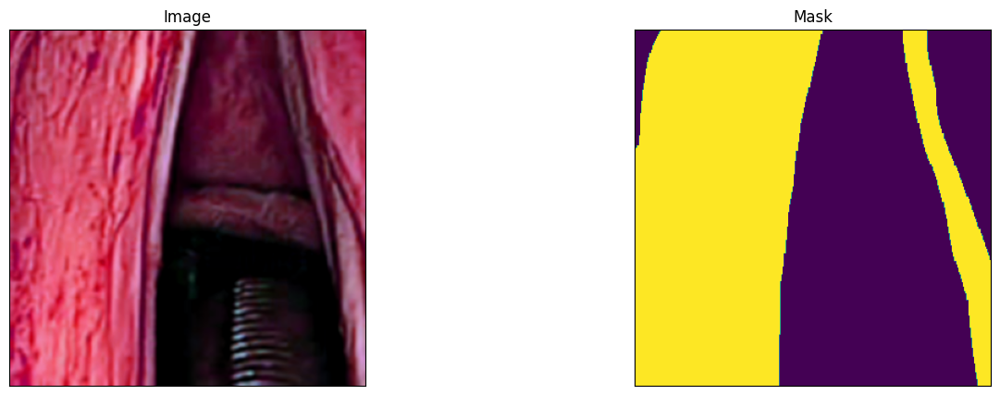

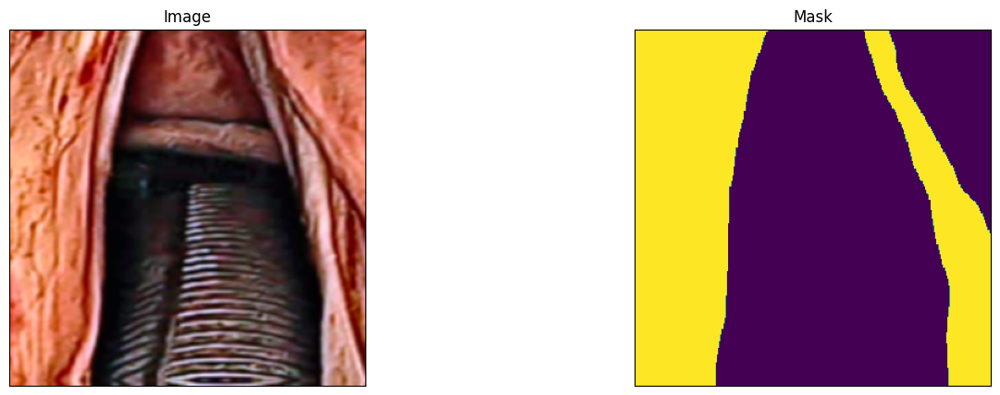

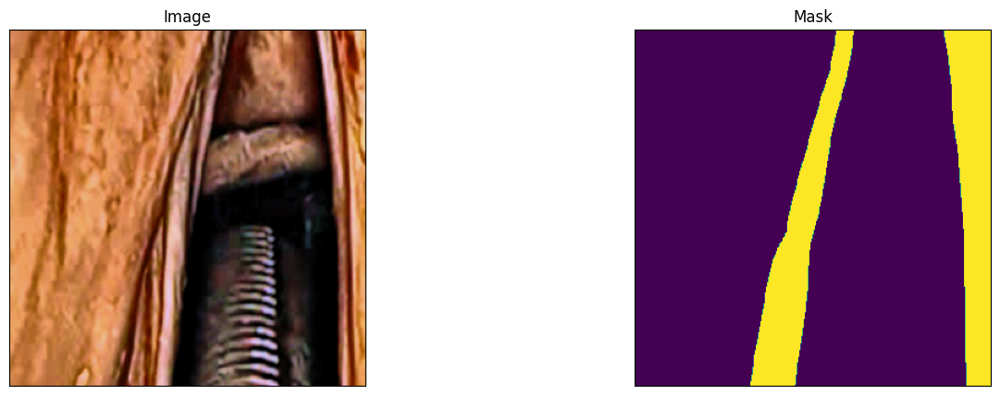

In [ ]:
#### Visualize resulted augmented images and masks

augmented_dataset = Dataset(img, mask, classes=['vocal folds'],augmentation=get_augmentation())

# same image with different random transforms
for i in range(10):
    image, mask = augmented_dataset[1]
    visualize(image=image, mask=mask.squeeze(-1))

## Create and train model

In [11]:
ENCODER = 'resnet34'
ENCODER_WEIGHTS = 'imagenet'
CLASSES = ['void', 'vocal folds', 'other tissue', 'glottal space', 'pathology',
               'surgical tool', 'intubation']
ACTIVATION = 'softmax2d' # could be None for logits or 'softmax2d' for multicalss segmentation
DEVICE = 'cuda'

# create segmentation model with pretrained encoder
model = smp.Unet(
    encoder_name=ENCODER,
    encoder_weights=ENCODER_WEIGHTS,
    classes=len(CLASSES),
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 297MB/s]


In [12]:
#Split dataset into train, validation and test sets
dataset = Dataset(
                  img,
                  mask,
                  augmentation=get_augmentation(),
                  preprocessing=get_preprocessing(preprocessing_fn),
                  classes=CLASSES,
)



In [13]:
n_train = int(0.7 * len(dataset))
n_val = int(0.2 * len(dataset))
n_test = len(dataset) - n_train - n_val
train_dataset, valid_dataset, test_dataset = torch.utils.data.random_split(dataset, (n_train, n_val, n_test))



In [14]:
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=2)
valid_loader = DataLoader(valid_dataset, batch_size=1, shuffle=False, num_workers=2)

In [27]:
# Dice/F1 score - https://en.wikipedia.org/wiki/S%C3%B8rensen%E2%80%93Dice_coefficient
# IoU/Jaccard score - https://en.wikipedia.org/wiki/Jaccard_index

loss = DiceLoss()
metrics = [
    IoU(threshold=0.5),
]

optimizer = torch.optim.Adam([
    dict(params=model.parameters(), lr=0.0001),
])

In [28]:
# create epoch runners
# it is a simple loop of iterating over dataloader`s samples
train_epoch = TrainEpoch(
    model,
    loss=loss,
    metrics=metrics,
    optimizer=optimizer,
    device = DEVICE,
    verbose=True,
)

valid_epoch = ValidEpoch(
    model,
    loss=loss,
    metrics=metrics,
    device = DEVICE,
    verbose=True,
)

In [29]:
# train model for 40 epochs

max_score = 0

for i in range(0, 40):

    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)

    # do something (save model, change lr, etc.)
    if max_score < valid_logs['iou_score']:
        max_score = valid_logs['iou_score']
        torch.save(model, './best_model.pth')
        print('Model saved!')

    if i == 25:
        optimizer.param_groups[0]['lr'] = 1e-5
        print('Decrease decoder learning rate to 1e-5!')


Epoch: 0
valid: 100%|██████████| 101/101 [00:11<00:00,  9.12it/s, dice_loss - 0.5843, iou_score - 0.3665]
Model saved!

Epoch: 1
valid: 100%|██████████| 101/101 [00:09<00:00, 10.53it/s, dice_loss - 0.4511, iou_score - 0.5066]
Model saved!

Epoch: 2
valid: 100%|██████████| 101/101 [00:09<00:00, 11.18it/s, dice_loss - 0.3643, iou_score - 0.6231]
Model saved!

Epoch: 3
valid: 100%|██████████| 101/101 [00:10<00:00,  9.34it/s, dice_loss - 0.2987, iou_score - 0.7118]
Model saved!

Epoch: 4
valid: 100%|██████████| 101/101 [00:10<00:00,  9.32it/s, dice_loss - 0.2753, iou_score - 0.7001]

Epoch: 5
valid: 100%|██████████| 101/101 [00:08<00:00, 11.27it/s, dice_loss - 0.2249, iou_score - 0.7595]
Model saved!

Epoch: 6
valid: 100%|██████████| 101/101 [00:09<00:00, 11.15it/s, dice_loss - 0.2062, iou_score - 0.764]
Model saved!

Epoch: 7
valid: 100%|██████████| 101/101 [00:09<00:00, 10.70it/s, dice_loss - 0.1878, iou_score - 0.7709]
Model saved!

Epoch: 8
valid: 100%|██████████| 101/101 [00:08<00:00

## Test model

In [30]:
# load best saved checkpoint
best_model = torch.load('./best_model.pth')

In [31]:
test_dataloader = DataLoader(test_dataset)

In [32]:
# evaluate model on test set
test_epoch = ValidEpoch(
    model=best_model,
    loss=loss,
    metrics=metrics,
    device=DEVICE,
)

logs = test_epoch.run(test_dataloader)

valid: 100%|██████████| 51/51 [00:05<00:00,  9.41it/s, dice_loss - 0.068, iou_score - 0.8925]


## Visualize predictions

In [33]:
# test dataset without transformations for image visualization
test_dataset_vis = Dataset(
    img,mask,
    classes=CLASSES,
)

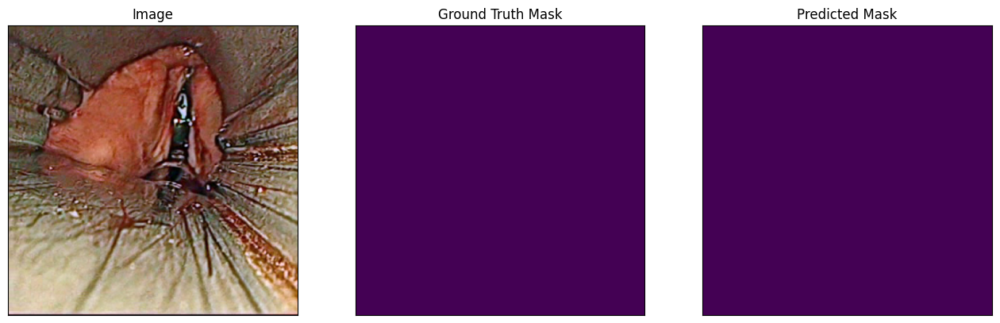

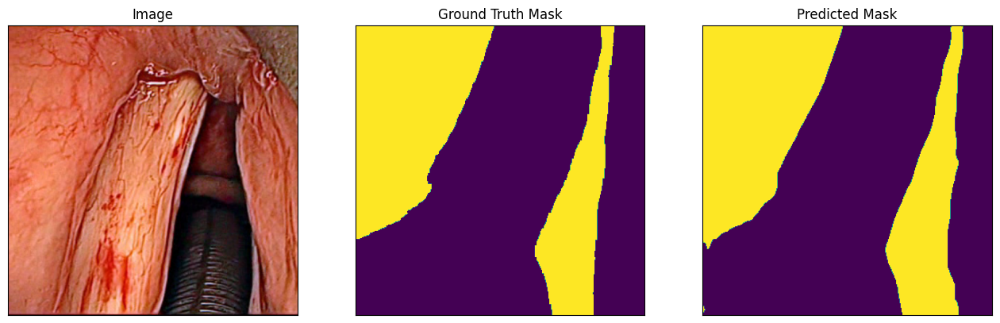

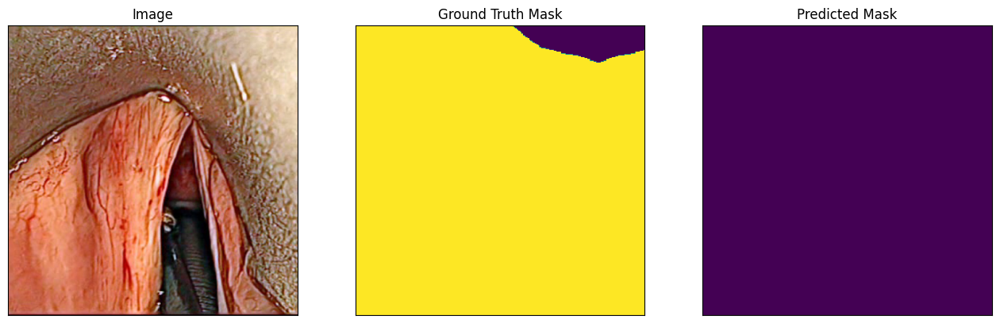

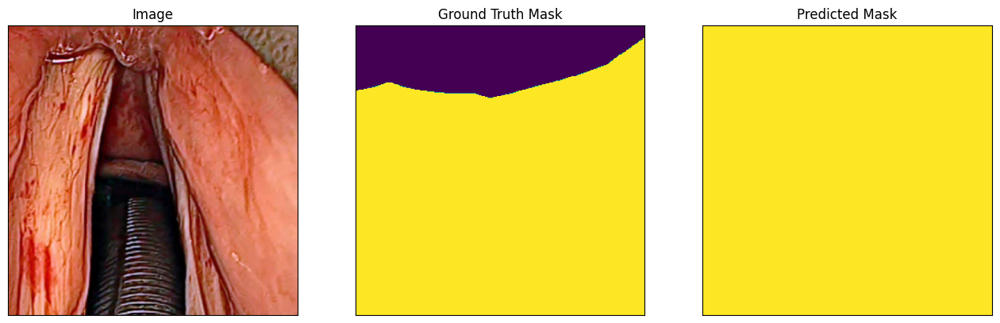

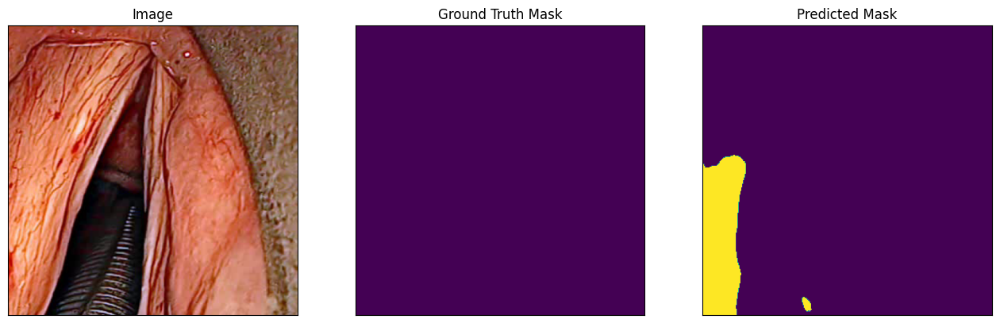

In [46]:
for i in range(5):
    n = np.random.choice(len(test_dataset))

    image_vis = test_dataset_vis[n][0].astype('uint8')
    image, gt_mask = test_dataset[n]

    gt_mask = gt_mask.squeeze()

    # Select a single channel from gt_mask (assuming it's a multi-channel mask)
    gt_mask = gt_mask[1]  # Select a channel (0,1 or 2) (adjust the index if needed)


    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    pr_mask = best_model.predict(x_tensor)
    pr_mask = (pr_mask.squeeze().cpu().numpy().round())
    # Select a single channel from pr_mask (assuming it's a multi-channel prediction)
    pr_mask = pr_mask[1]  # Select a channel (0,1 or 2) (adjust the index if needed)


    visualize(
        image=image_vis,
        ground_truth_mask=gt_mask,
        predicted_mask=pr_mask
    )